In [53]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import os
import seaborn as sns
from dataloader import DataLoader
from PIL import Image
from _graphutils import GraphUtils
from _plotutils import PlotUtils
from kernels.wlkernel import WLKernel
from kernels.shortestpathkernel import ShortestPathKernel
from kernels.randomwalkkernel import RandomWalkKernel
from kernels.labelhasher import LabelHasher
from __PIPELINES import Pipeline

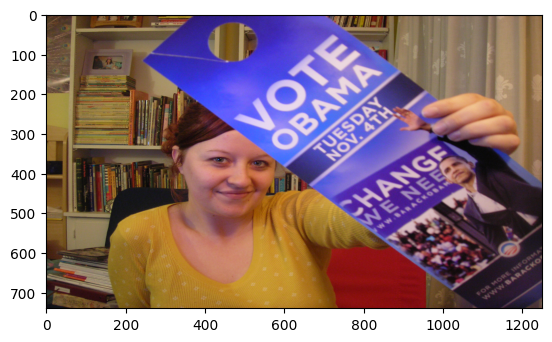

In [ ]:
dl = DataLoader("../eyelink_data")

imgs = dl.get_most_used_images()

 # 6, 7, 11, 12, 13, 18
img = imgs[39]
img_file = dl.get_image(img)

plt.imshow(img_file)

PLOT = True

/home/simontitk/projects/python/gaze3p/src/kernels/shortestpathkernel.py:11: RuntimeWarning: divide by zero encountered in log
  cost_matrix = np.where(transition_matrix_norm > 0, -np.log(transition_matrix_norm), np.inf)
/home/simontitk/.pyenv/versions/gaze3p-env/lib/python3.12/site-packages/sklearn/manifold/_mds.py:677: FutureWarning: The default value of `n_init` will change from 4 to 1 in 1.9.
  warnings.warn(


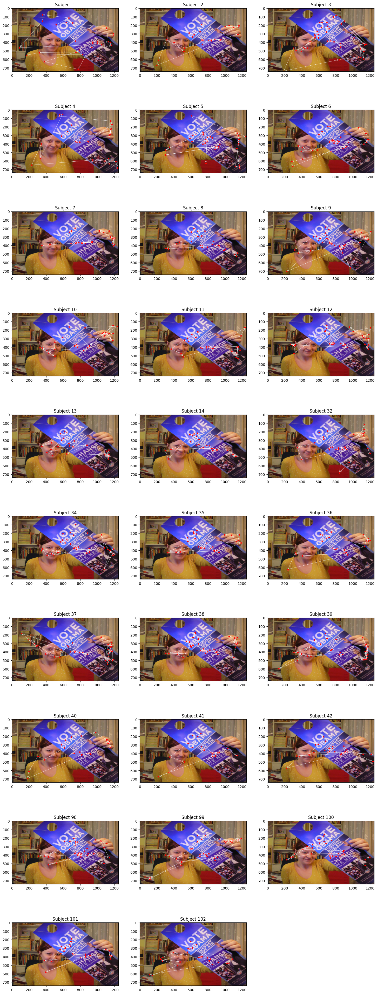

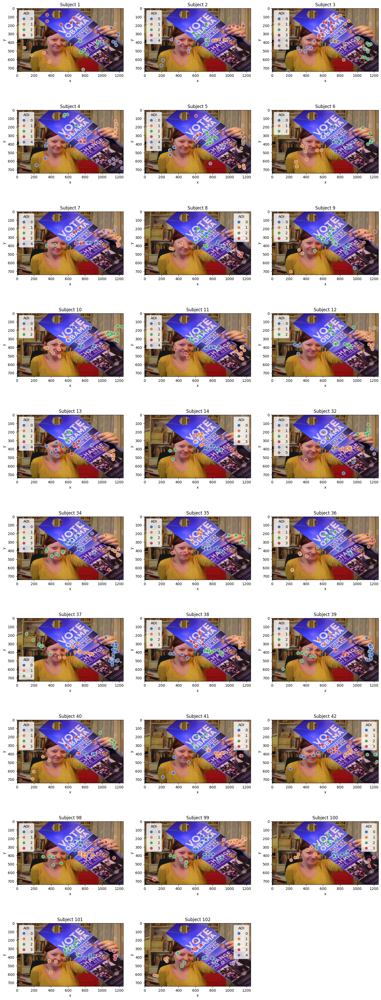

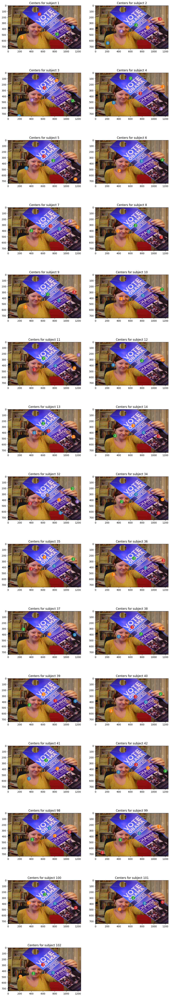

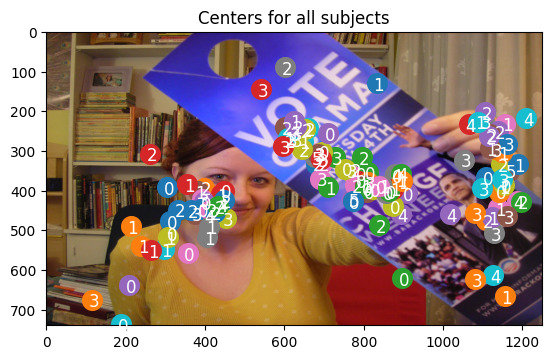

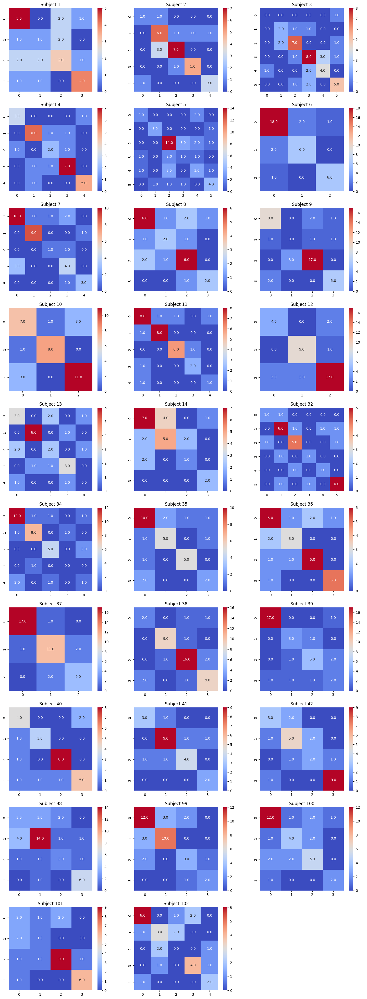

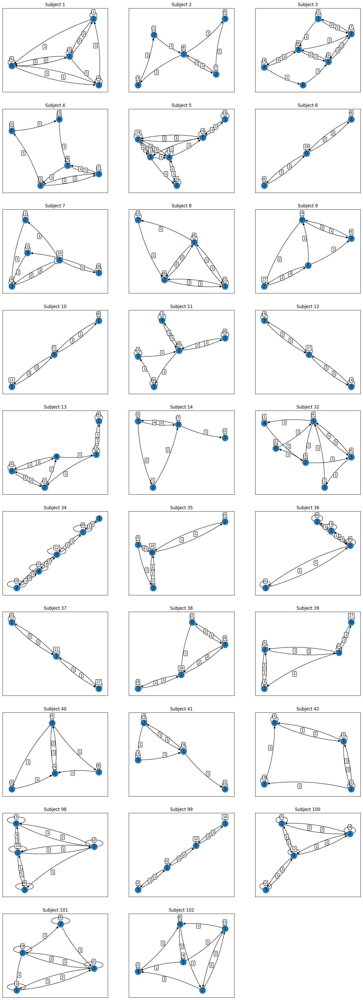

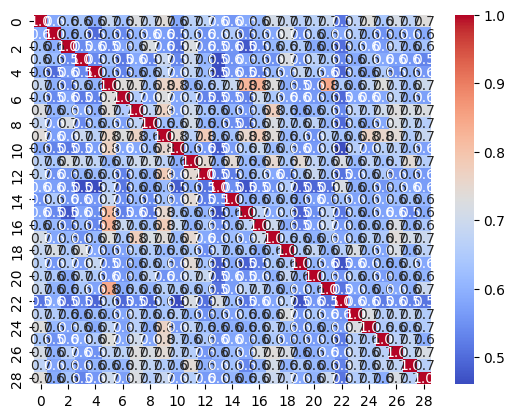

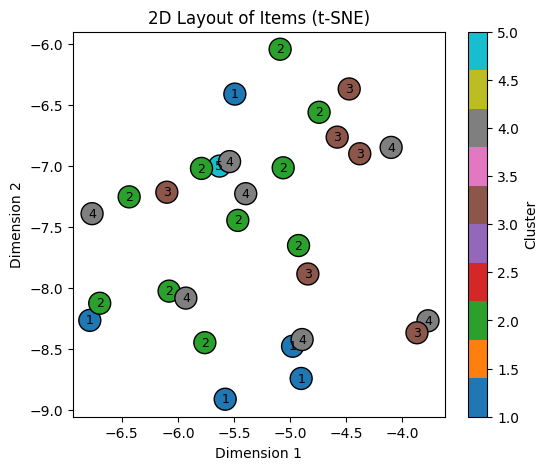

In [56]:
Pipeline.shortest_path_kernel(img, PLOT)

In [ ]:
trials = dl.get_image_trials(img)
trial_numbers = dl.get_image_trials(img, False)
answer_dfs = dl.get_image_answers(img)
answers = {subject: answer_dfs[subject].query(f"trial == {trial_numbers[subject]}")["response"].item() for subject in trials.keys()}

if PLOT:
    PlotUtils.wrap_dict_plot(trials, n_wrap=3, plotting_function=PlotUtils.trace_plot, title="Subject", image=img_file)

In [ ]:
MIN_CLUSTERS = 2
MAX_CLUSTERS = 10

trials_clustered: dict[int, pd.DataFrame] = {}
cluster_centers: dict[int, dict[int, tuple[float, float]]] = {}
for (subject, trial) in trials.items():
    df_clustered, intertia, cluster_c, k = GraphUtils.optimal_clustering(MIN_CLUSTERS, MAX_CLUSTERS, trial)
    trials_clustered[subject] = df_clustered
    cluster_centers[subject] = cluster_c

if PLOT:
    PlotUtils.wrap_dict_plot(trials_clustered, n_wrap=3, plotting_function=PlotUtils.clustering_plot, title="Subject", image=img_file)

In [ ]:
if PLOT:
    fig, axs = PlotUtils.wrap_subplots(len(cluster_centers), 2)
    for i, (subject, item) in enumerate(cluster_centers.items()):
        for aoi, (x, y) in item.items():
            axs[i].set(title=f"Centers for subject {subject}")
            axs[i].imshow(img_file)
            axs[i].scatter(x, y, s=200)
            axs[i].text(x + 5, y + 5, str(aoi), fontsize=12, ha='center', va='center', color='white')


In [ ]:
if PLOT:
    fig, ax= plt.subplots(1,1)
    for i, (subject, item) in enumerate(cluster_centers.items()):
        for aoi, (x, y) in item.items():
            ax.imshow(img_file)
            ax.scatter(x, y, s=200)
            ax.text(x + 5, y + 5, str(aoi), fontsize=12, ha='center', va='center', color='white')
    ax.set(title=f"Centers for all subjects")

In [ ]:
matrices = {subject: GraphUtils.transition_matrix(trial) for (subject, trial) in trials_clustered.items()}
if PLOT:
    PlotUtils.wrap_dict_plot(matrices, n_wrap=3, plotting_function=PlotUtils.heatmap, title="Subject")


In [ ]:
graphs = {subject: GraphUtils.transition_matrix_to_graph(matrix) for (subject, matrix) in matrices.items()}
if PLOT:
    PlotUtils.wrap_dict_plot(graphs, n_wrap=3, plotting_function=PlotUtils.draw, title="Subject")

In [ ]:
subjects_order =list(matrices.keys())
K_matrix = np.zeros(shape=(len(matrices), len(matrices)))
for i, (subject1, matrix1) in enumerate(matrices.items()):
    for j, (subject2, matrix2) in enumerate(matrices.items()):
        K = ShortestPathKernel.get_kernel_value(matrix1, matrix2, kernel=ShortestPathKernel.inverse_abs_diff_kernel, normalize=True)
        K_matrix[i][j] = K
        
PlotUtils.heatmap(K_matrix)

In [ ]:
from sklearn.manifold import MDS, TSNE

D_matrix = 1 - K_matrix

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
X_2d = mds.fit_transform(D_matrix)

tsne = TSNE(n_components=2, perplexity=20, metric='precomputed', init="random", random_state=42)
X_2d = tsne.fit_transform(D_matrix)
labels = [answers[subject] for subject in subjects_order]

plt.figure(figsize=(6, 5))
scatter = plt.scatter(
    X_2d[:, 0], X_2d[:, 1],
    c=labels,              
    cmap='tab10',          
    s=250,                 
    edgecolor='k'
)

for i, label in enumerate(labels):
    plt.text(X_2d[i,0], X_2d[i,1], str(label),
             color='black', fontsize=9,
             ha='center', va='center')
    
plt.title("2D Layout of Items (t-SNE)")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.colorbar(scatter, label='Cluster')
plt.show()